# Dry Bean Classification
Details can be found here - http://archive.ics.uci.edu/dataset/602/dry+bean+dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import os

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedShuffleSplit

from pycaret.classification import ClassificationExperiment

model_save_path = os.path.join(os.path.expanduser("~"), 'pycaret_models', 'dry_beans_classification')

### Get Dataset

In [2]:
dry_bean_data = pd.read_excel('../../data/Dry_Bean_Dataset.xlsx')
print(dry_bean_data.shape)
dry_bean_data.head()

(13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
dry_bean_data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [4]:
dry_bean_data.isna().values.sum() # no na

0

In [5]:
dry_bean_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

### Data analysis

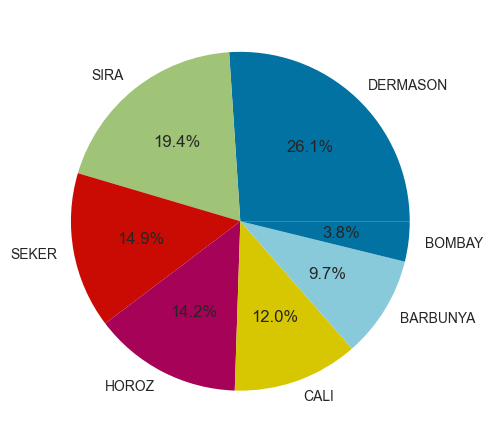

In [6]:
label = 'Class'
sizes = dry_bean_data[label].value_counts()

fig, ax = plt.subplots()
ax.pie(sizes, labels=sizes.index, autopct='%1.1f%%')
plt.show()

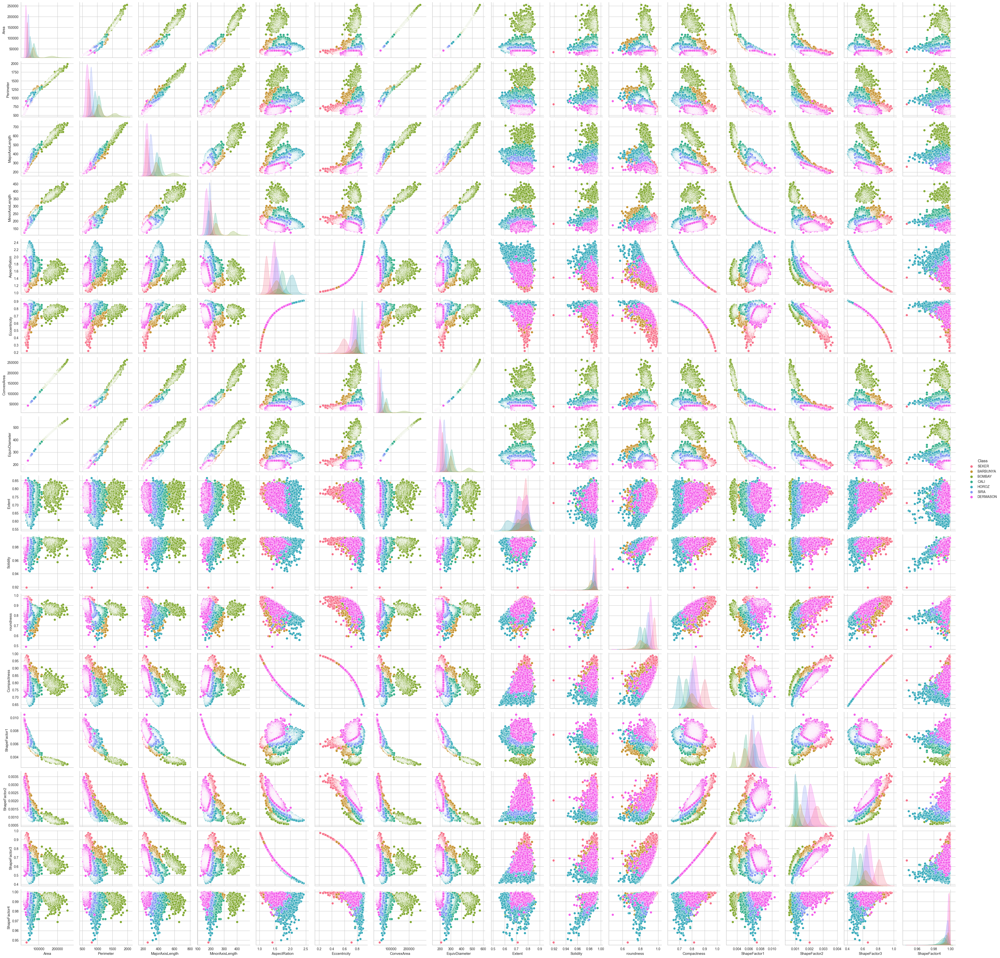

In [7]:
sns.pairplot(dry_bean_data, hue=label);

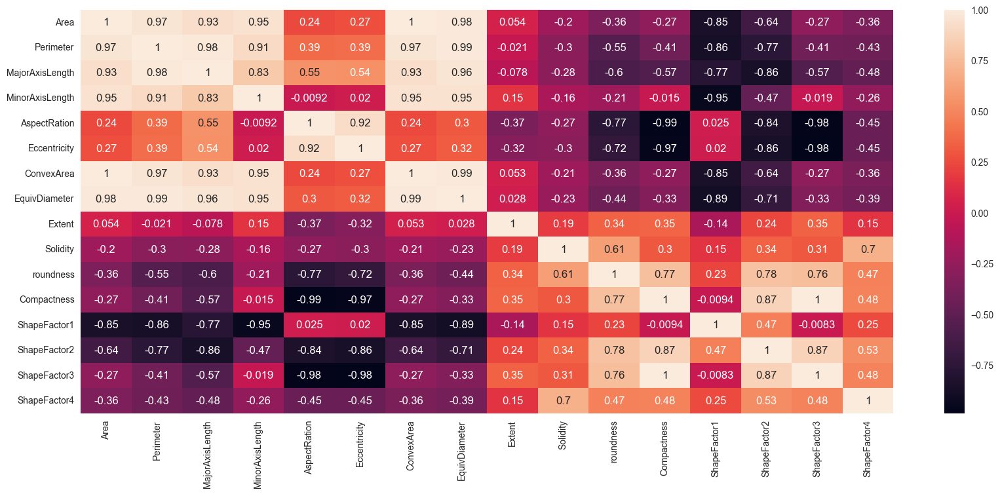

In [8]:
fig, ax = plt.subplots(figsize=(20, 8))
sns.heatmap(dry_bean_data.corr(), annot=True, ax=ax);
plt.show()

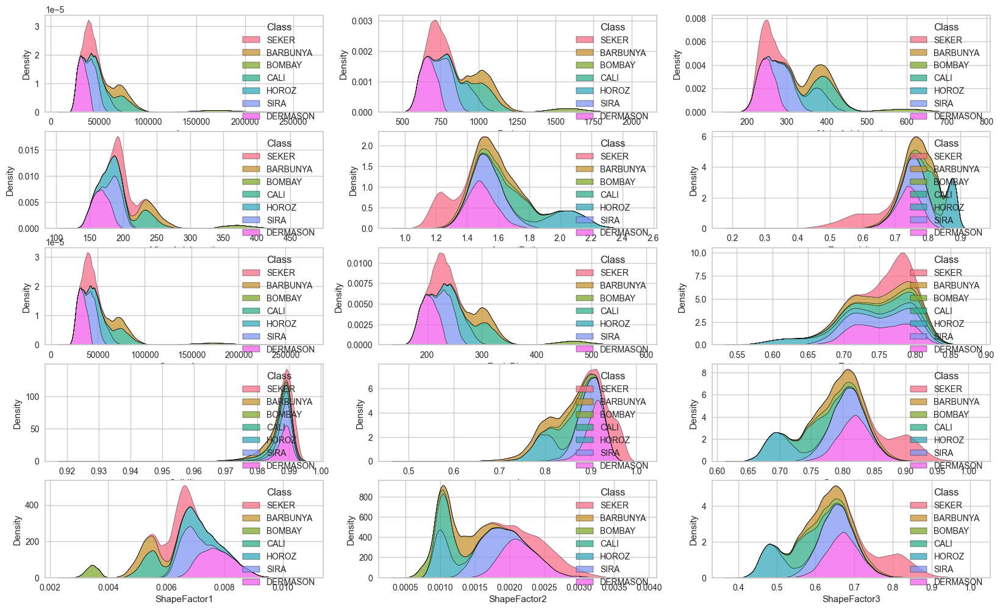

In [9]:
all_variables = dry_bean_data.columns
label = 'Class'
all_variables = all_variables.drop(label)

fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(20, 12))

for row in range(0, 5):
    for col in range(0, 3):
        sns.kdeplot(data=dry_bean_data, x=all_variables[row*3+col], hue=label, multiple="stack", ax=axs[row][col])

### split dataset

In [10]:
#split data
strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=21)
test_df = None
train_df = None
for train_idx, test_idx in strat_split.split(dry_bean_data, dry_bean_data[label]):
    test_df = dry_bean_data.loc[test_idx]
    train_df = dry_bean_data.loc[train_idx]
    
print(train_df.shape)    
print(test_df.shape)

(11569, 17)
(2042, 17)


### Train AutoML with PyCaret

In [11]:
exp = ClassificationExperiment()
exp = exp.setup(train_df, target=label, use_gpu=True,
                # feature_selection=True, n_features_to_select=0.9, feature_selection_estimator='lightgbm',
                session_id = 21)

,Description,Value
0,Session id,21
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(11569, 17)"
5,Transformed data shape,"(11569, 17)"
6,Transformed train set shape,"(8098, 17)"
7,Transformed test set shape,"(3471, 17)"
8,Numeric features,16
9,Preprocess,True


In [12]:
best_model = exp.compare_models(sort='Accuracy')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9250,0.9936,0.9250,0.9257,0.9251,0.9093,0.9094,15.6130
gbc,Gradient Boosting Classifier,0.9220,0.9925,0.9220,0.9227,0.9219,0.9056,0.9057,2.4130
xgboost,Extreme Gradient Boosting,0.9213,0.9932,0.9213,0.9220,0.9214,0.9048,0.9050,4.0350
lightgbm,Light Gradient Boosting Machine,0.9208,0.9932,0.9208,0.9217,0.9209,0.9042,0.9044,11.4120
rf,Random Forest Classifier,0.9203,0.9917,0.9203,0.9210,0.9203,0.9036,0.9038,1.6470
et,Extra Trees Classifier,0.9157,0.9912,0.9157,0.9165,0.9157,0.8979,0.8981,1.9000
qda,Quadratic Discriminant Analysis,0.9097,0.9910,0.9097,0.9144,0.9102,0.8911,0.8920,1.1530
lda,Linear Discriminant Analysis,0.9038,0.9911,0.9038,0.9147,0.9055,0.8837,0.8856,1.5130
dt,Decision Tree Classifier,0.8913,0.9331,0.8913,0.8921,0.8914,0.8686,0.8687,1.0160
lr,Logistic Regression,0.8614,0.9787,0.8614,0.8626,0.8614,0.8323,0.8325,1.2020


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [13]:
exp.evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

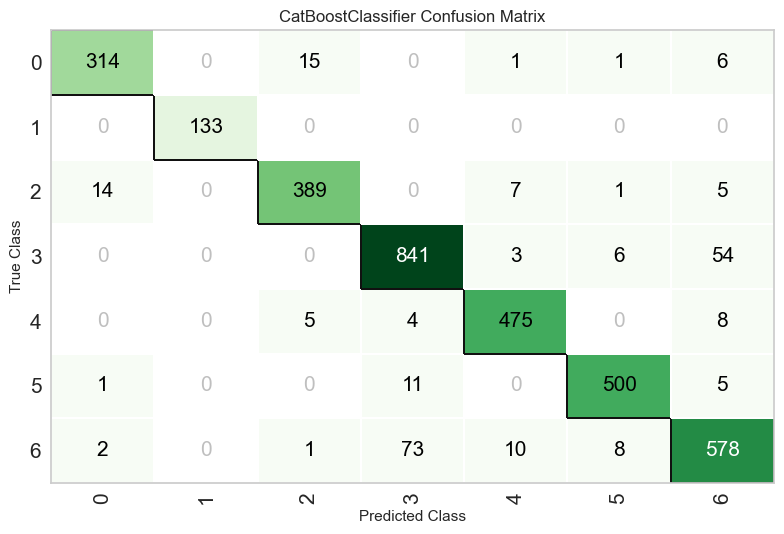

In [14]:
exp.plot_model(best_model, plot = 'confusion_matrix') 

In [19]:
train_predictions = exp.predict_model(best_model, data=train_df)
train_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9746,0.9983,0.9746,0.9746,0.9746,0.9693,0.9693


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,prediction_label,prediction_score
2137,55805,934.263977,333.924042,213.197845,1.566264,0.769653,56596,266.557922,0.709374,0.986024,0.803422,0.798259,0.005984,0.001499,0.637218,0.998051,0,BARBUNYA,0.9994
8710,44453,786.843018,289.318756,196.443970,1.472780,0.734149,44977,237.906113,0.729791,0.988350,0.902266,0.822298,0.006508,0.001836,0.676173,0.995855,6,SIRA,0.9986
13397,39695,736.526978,276.079895,183.393936,1.505393,0.747485,40036,224.813797,0.791731,0.991483,0.919535,0.814307,0.006955,0.001886,0.663096,0.998220,3,DERMASON,0.9683
10676,27381,610.721008,220.244385,158.644608,1.388288,0.693651,27756,186.715210,0.747257,0.986489,0.922515,0.847764,0.008044,0.002563,0.718703,0.997767,3,DERMASON,0.9997
294,35087,678.150024,237.293869,188.492279,1.258905,0.607472,35477,211.362610,0.768946,0.989007,0.958748,0.890721,0.006763,0.002626,0.793384,0.998795,5,SEKER,0.9981


In [21]:
def print_metrics(y_true, y_pred):
    print("Accuracy score:", round(accuracy_score(y_true, y_pred),4))
    print("Precision score:", round(precision_score(y_true, y_pred, average='macro'),4))
    print("Recall score:", round(recall_score(y_true, y_pred, average='macro'),4))
    print("F1 score:", round(f1_score(y_true, y_pred, average='macro'),4))
    print("Confusion Matrix")
    ax =  sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt='')
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted');
    
label_map = {
    'BARBUNYA': 0, 'BOMBAY': 1, 'CALI': 2, 'DERMASON': 3, 'HOROZ': 4, 'SEKER': 5, 'SIRA': 6
}

In [25]:
train_y_pred = train_predictions['prediction_label'].map(label_map)
train_y_true = train_predictions['Class']

Accuracy score: 0.9746
Precision score: 0.9795
Recall score: 0.9782
F1 score: 0.9788
Confusion Matrix


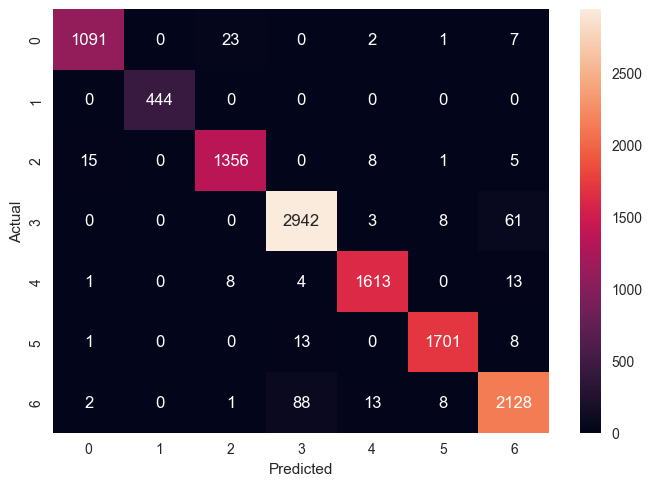

In [26]:
print_metrics(train_y_true, train_y_pred)

### Tune Model

In [28]:
best_model = exp.tune_model(best_model, choose_better = True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9160,0.9923,0.9160,0.9178,0.9166,0.8984,0.8985
1,0.9296,0.9931,0.9296,0.9305,0.9293,0.9148,0.9152
2,0.9333,0.9951,0.9333,0.9332,0.9332,0.9194,0.9194
3,0.9259,0.9928,0.9259,0.9257,0.9256,0.9104,0.9105
4,0.9222,0.9935,0.9222,0.9242,0.9227,0.9059,0.9061
5,0.9235,0.9944,0.9235,0.9239,0.9236,0.9074,0.9074
6,0.9321,0.9939,0.9321,0.9336,0.9320,0.9177,0.9181
7,0.9198,0.9944,0.9198,0.9198,0.9195,0.9030,0.9031
8,0.9184,0.9940,0.9184,0.9190,0.9186,0.9013,0.9013


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.9504,0.9969,0.9504,0.9505,0.9504,0.9400,0.9400


Accuracy score: 0.9504
Precision score: 0.9603
Recall score: 0.9571
F1 score: 0.9587
Confusion Matrix


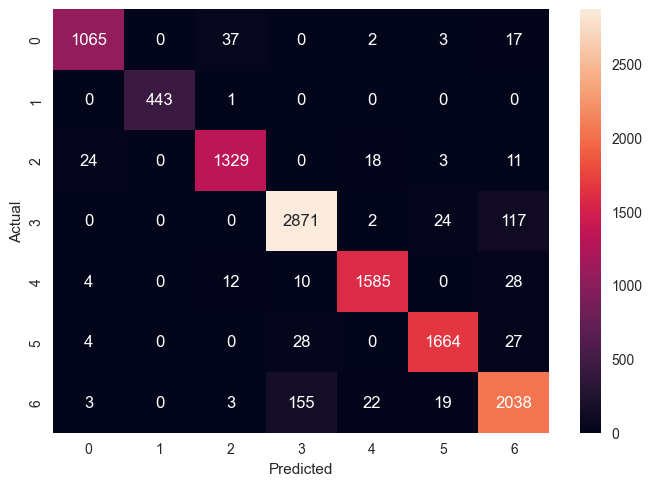

In [29]:
train_predictions = exp.predict_model(best_model, data=train_df)
train_y_pred = train_predictions['prediction_label'].map(label_map)
train_y_true = train_predictions['Class']

print_metrics(train_y_true, train_y_pred) ## Kinda dropped in metrics

### Ensemble models manually

In [36]:
ensembled_model = exp.blend_models(exp.compare_models(n_select = 4)) # ensemble top four models

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.9250,0.9936,0.9250,0.9257,0.9251,0.9093,0.9094,1.0980
gbc,Gradient Boosting Classifier,0.9220,0.9925,0.9220,0.9227,0.9219,0.9056,0.9057,1.7320
xgboost,Extreme Gradient Boosting,0.9213,0.9932,0.9213,0.9220,0.9214,0.9048,0.9050,1.4710
lightgbm,Light Gradient Boosting Machine,0.9208,0.9932,0.9208,0.9217,0.9209,0.9042,0.9044,1.4940
rf,Random Forest Classifier,0.9203,0.9917,0.9203,0.9210,0.9203,0.9036,0.9038,1.5830
et,Extra Trees Classifier,0.9157,0.9912,0.9157,0.9165,0.9157,0.8979,0.8981,1.7230
qda,Quadratic Discriminant Analysis,0.9097,0.9910,0.9097,0.9144,0.9102,0.8911,0.8920,1.0930
lda,Linear Discriminant Analysis,0.9038,0.9911,0.9038,0.9147,0.9055,0.8837,0.8856,1.0790
dt,Decision Tree Classifier,0.8913,0.9331,0.8913,0.8921,0.8914,0.8686,0.8687,1.0950
lr,Logistic Regression,0.8614,0.9787,0.8614,0.8626,0.8614,0.8323,0.8325,1.2900


Processing:   0%|          | 0/72 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9185,0.9925,0.9185,0.9205,0.9191,0.9014,0.9015
1,0.9235,0.9940,0.9235,0.9245,0.9231,0.9073,0.9078
2,0.9395,0.9948,0.9395,0.9394,0.9393,0.9268,0.9269
3,0.9321,0.9931,0.9321,0.9322,0.9319,0.9178,0.9179
4,0.9210,0.9931,0.9210,0.9226,0.9213,0.9043,0.9045
5,0.9247,0.9936,0.9247,0.9250,0.9246,0.9089,0.9090
6,0.9309,0.9941,0.9309,0.9318,0.9308,0.9163,0.9165
7,0.9210,0.9937,0.9210,0.9210,0.9207,0.9045,0.9046
8,0.9246,0.9938,0.9246,0.9253,0.9248,0.9088,0.9089


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.9780,0.9985,0.9780,0.9781,0.9780,0.9734,0.9735


Accuracy score: 0.978
Precision score: 0.9826
Recall score: 0.9814
F1 score: 0.982
Confusion Matrix


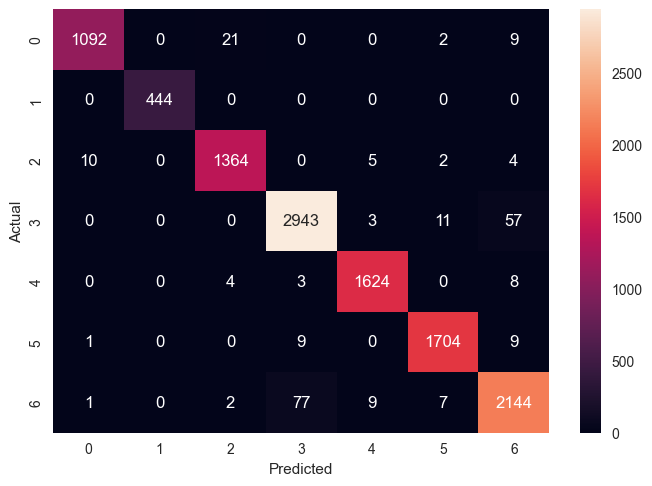

In [37]:
train_predictions = exp.predict_model(ensembled_model, data=train_df)
train_y_pred = train_predictions['prediction_label'].map(label_map)
train_y_true = train_predictions['Class']

print_metrics(train_y_true, train_y_pred) # # Kinda upped in metrics

## Testing and evaluation

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Voting Classifier,0.9305,0.9951,0.9305,0.9305,0.9303,0.9158,0.9159


Accuracy score: 0.9305
Precision score: 0.9421
Recall score: 0.9373
F1 score: 0.9395
Confusion Matrix


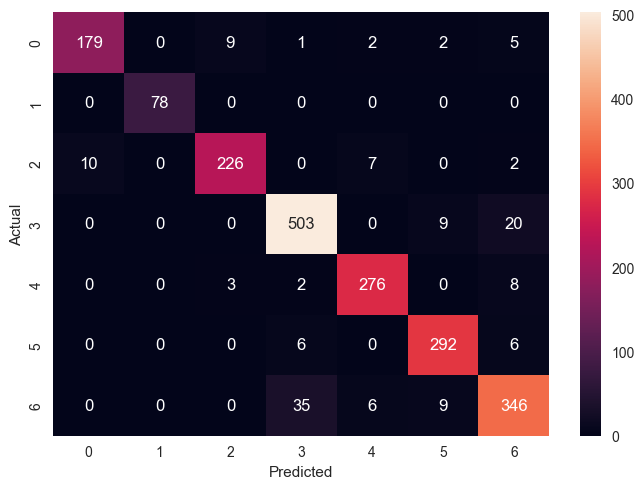

In [38]:
train_predictions = exp.predict_model(ensembled_model, data=test_df)
train_y_pred = train_predictions['prediction_label'].map(label_map)
train_y_true = train_predictions['Class']

print_metrics(train_y_true, train_y_pred)

### Save model 

In [40]:
exp.save_model(ensembled_model, model_save_path)

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\okmic\AppData\Local\Temp\joblib),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Area', 'Perimeter',
                                              'MajorAxisLength',
                                              'MinorAxisLength', 'AspectRation',
                                              'Eccentricity', 'ConvexArea',
                                              'E...
                                                               learning_rate=0.1,
                                                               max_depth=-1,
                                                               min_child_samples=20,
                                                       